In [66]:
!pip install missingno
!pip install pandas_profiling
!pip install ipywidgets
!pip install rfpimp


[notice] A new release of pip is available: 23.0.1 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [67]:
import pandas as pd
# To visualize missing values
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from rfpimp import *
warnings.filterwarnings('ignore')


In [38]:
data = pd.read_csv("C:\\Users\\91966\\Desktop\\Sem 3\\303 Marketing Analytics\\Churn Analytics\\New Churn Lab\\E-Commerce Churn Data.csv")
data.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,160
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,121
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,130


In [39]:
data.shape

(5630, 20)

In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [41]:
data.nunique()

CustomerID                     5630
Churn                             2
Tenure                           36
PreferredLoginDevice              3
CityTier                          3
WarehouseToHome                  34
PreferredPaymentMode              7
Gender                            2
HourSpendOnApp                    6
NumberOfDeviceRegistered          6
PreferedOrderCat                  6
SatisfactionScore                 5
MaritalStatus                     3
NumberOfAddress                  15
Complain                          2
OrderAmountHikeFromlastYear      16
CouponUsed                       17
OrderCount                       16
DaySinceLastOrder                22
CashbackAmount                  220
dtype: int64

In [42]:
# seprating object and numeric data type
int_columns = data.select_dtypes(include=['int64', 'float64']).columns
object_columns = data.select_dtypes(include=['object']).columns
int_columns,object_columns
# data.select_dtypes('o')

(Index(['CustomerID', 'Churn', 'Tenure', 'CityTier', 'WarehouseToHome',
        'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore',
        'NumberOfAddress', 'Complain', 'OrderAmountHikeFromlastYear',
        'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'],
       dtype='object'),
 Index(['PreferredLoginDevice', 'PreferredPaymentMode', 'Gender',
        'PreferedOrderCat', 'MaritalStatus'],
       dtype='object'))

In [43]:
data.describe(include='O')

,PreferredLoginDevice,PreferredPaymentMode,Gender,PreferedOrderCat,MaritalStatus
count,5630,5630,5630,5630,5630
unique,3,7,2,6,3
top,Mobile Phone,Debit Card,Male,Laptop & Accessory,Married
freq,2765,2314,3384,2050,2986


In [44]:
for col in data.columns:
    if data[col].dtype == object:
        print(str(col) + ' : ' + str(data[col].unique()))
        # print(data[col].value_counts())
        print(data[col].value_counts())
        print("________________________________________________________________________________")
for col in data.columns:
    if data[col].dtype != object:
        print(str(col) + ' : ' + str(data[col].unique()))
        # print(data[col].value_counts())
        print(data[col].value_counts())
        print("________________________________________________________________________________")

PreferredLoginDevice : ['Mobile Phone' 'Phone' 'Computer']
PreferredLoginDevice
Mobile Phone    2765
Computer        1634
Phone           1231
Name: count, dtype: int64
________________________________________________________________________________
PreferredPaymentMode : ['Debit Card' 'UPI' 'CC' 'Cash on Delivery' 'E wallet' 'COD' 'Credit Card']
PreferredPaymentMode
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: count, dtype: int64
________________________________________________________________________________
Gender : ['Female' 'Male']
Gender
Male      3384
Female    2246
Name: count, dtype: int64
________________________________________________________________________________
PreferedOrderCat : ['Laptop & Accessory' 'Mobile' 'Mobile Phone' 'Others' 'Fashion' 'Grocery']
PreferedOrderCat
Laptop & Accessory    2050
Mobile Phone          1271
Fashion    

In [45]:
#As mobile phone and phone are both same so we have merged them
data.loc[data['PreferredLoginDevice'] == 'Phone', 'PreferredLoginDevice' ] = 'Mobile Phone'
data.loc[data['PreferedOrderCat'] == 'Mobile', 'PreferedOrderCat' ] = 'Mobile Phone'

#As COD and Cash On Delivery are same for PreferredPaymentMode , merging is required
data.loc[data['PreferredPaymentMode'] == 'COD', 'PreferredPaymentMode'] = 'Cash on Delivery'
#As CC and Credit card are same for PreferredPaymentMode , merging is required
data.loc[data['PreferredPaymentMode'] == 'CC', 'PreferredPaymentMode'] = 'Credit Card'

# checking the result after changes
print(data['PreferredPaymentMode'].value_counts(), "\n")
print("-"*50)
print(data['PreferedOrderCat'].value_counts(), "\n")
print("-"*50)
print(data['PreferredLoginDevice'].value_counts())

PreferredPaymentMode
Debit Card          2314
Credit Card         1774
E wallet             614
Cash on Delivery     514
UPI                  414
Name: count, dtype: int64 

--------------------------------------------------
PreferedOrderCat
Mobile Phone          2080
Laptop & Accessory    2050
Fashion                826
Grocery                410
Others                 264
Name: count, dtype: int64 

--------------------------------------------------
PreferredLoginDevice
Mobile Phone    3996
Computer        1634
Name: count, dtype: int64


Data Cleaning

In [46]:
#count null value in each column
data.isna().sum()

CustomerID                       0
Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

In [47]:
# comparing missing values in percent witgh total dataset
missibg_values_columns =  [column  for column in data.columns if data[column].isna().sum() > 0]
missing_calculation = []
for col in data.columns:
    missing_calculation.append([col, data[col].isna().sum(), data[col].isna().sum()/data.shape[0]])
missing_calculation = pd.DataFrame(missing_calculation, columns=['Column', 'No. Of missing Values', 'Percent'])
result = missing_calculation.groupby(by=['Column','No. Of missing Values', 'Percent']).count().sort_values(by='No. Of missing Values', ascending=False)
result


,,
Column,No. Of missing Values,Percent
DaySinceLastOrder,307,0.054529
OrderAmountHikeFromlastYear,265,0.047069
Tenure,264,0.046892
OrderCount,258,0.045826
CouponUsed,256,0.045471
HourSpendOnApp,255,0.045293
WarehouseToHome,251,0.044583
SatisfactionScore,0,0.000000
PreferredPaymentMode,0,0.000000


In [48]:
# filling missing values with mean
for column in missibg_values_columns:
    data[column].fillna(np.mean(data[column]), inplace=True)

# reviewing data after na replacement
for col in data.columns:
    print(str(col) + ' : ' + str(data[col].unique()))
    # print(data[col].value_counts())
    print(data[col].value_counts())
    print("________________________________________________________________________________")

CustomerID : [50001 50002 50003 ... 55628 55629 55630]
CustomerID
50001    1
53751    1
53759    1
53758    1
53757    1
        ..
51876    1
51875    1
51874    1
51873    1
55630    1
Name: count, Length: 5630, dtype: int64
________________________________________________________________________________
Churn : [1 0]
Churn
0    4682
1     948
Name: count, dtype: int64
________________________________________________________________________________
Tenure : [ 4.         10.18989937  0.         13.         11.          9.
 19.         20.         14.          8.         18.          5.
  2.         30.          1.         23.          3.         29.
  6.         26.         28.          7.         24.         25.
 10.         15.         22.         27.         16.         12.
 21.         17.         50.         60.         31.         51.
 61.        ]
Tenure
1.000000     690
0.000000     508
10.189899    264
8.000000     263
9.000000     247
7.000000     221
10.000000    213
5.0000

In [49]:
#data for tableau
from pathlib import Path  
data_copy = data
filepath = Path("C:\\Users\\91966\\Desktop\\Sem 3\\303 Marketing Analytics\\Churn Analytics\\New Churn Lab\\churn_clean.csv")  
filepath.parent.mkdir(parents=True, exist_ok=True)  
data_copy.to_csv(filepath)  


# converting categorical value to numeric values
 

In [50]:
le = LabelEncoder()
for column in data.select_dtypes('object'):
    data[column] = le.fit_transform(data[column])

In [51]:
data.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.000000,1,3,6.0,2,0,3.000000,3,2,2,2,9,1,11.0,1.0,1.0,5.0,160
1,50002,1,10.189899,1,1,8.0,4,1,3.000000,4,3,3,2,7,1,15.0,0.0,1.0,0.0,121
2,50003,1,10.189899,1,1,30.0,2,1,2.000000,4,3,3,2,6,1,14.0,0.0,1.0,3.0,120
3,50004,1,0.000000,1,3,15.0,2,1,2.000000,4,2,5,2,8,0,23.0,0.0,1.0,3.0,134
4,50005,1,0.000000,1,1,12.0,1,1,2.931535,3,3,5,2,3,0,11.0,1.0,1.0,3.0,130


## Correlation

In [52]:
corr = data.corr()
corr

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
CustomerID,1.000000,-0.019083,0.029183,-0.002508,0.003239,0.057521,0.005522,0.004251,0.584227,0.411098,-0.000393,-0.033146,0.124088,0.160814,-0.009944,0.114471,0.228952,0.135815,0.109938,0.217173
Churn,-0.019083,1.000000,-0.335513,-0.051099,0.084703,0.073497,0.002345,0.029264,0.018126,0.107939,0.104569,0.105481,0.140316,0.043931,0.250188,-0.009949,-0.008197,-0.028342,-0.156152,-0.154161
Tenure,0.029183,-0.335513,1.000000,0.040324,-0.059603,-0.017301,-0.009958,-0.045980,-0.019451,-0.023506,-0.183603,-0.013627,-0.104242,0.232337,-0.020780,0.004907,0.119231,0.175909,0.175011,0.460687
PreferredLoginDevice,-0.002508,-0.051099,0.040324,1.000000,0.002476,-0.023328,0.006681,-0.015871,0.019566,-0.021096,0.005152,0.036049,-0.028785,0.025863,0.001327,-0.010775,-0.010495,-0.015756,0.001259,0.047822
CityTier,0.003239,0.084703,-0.059603,0.002476,1.000000,0.010445,0.246170,-0.025176,-0.008982,0.027934,-0.170513,-0.011554,0.006818,-0.029440,0.003375,-0.030811,0.021009,0.032625,0.016924,0.055698
WarehouseToHome,0.057521,0.073497,-0.017301,-0.023328,0.010445,1.000000,0.006478,-0.001038,0.058605,0.018641,-0.073370,0.007537,-0.012789,-0.010782,0.027969,0.036999,-0.003641,0.002222,0.016900,-0.009278
PreferredPaymentMode,0.005522,0.002345,-0.009958,0.006681,0.246170,0.006478,1.000000,0.016999,-0.004090,0.015938,-0.032268,-0.014640,-0.021391,-0.004544,0.023890,-0.000778,-0.001081,-0.032870,0.000179,0.037280
Gender,0.004251,0.029264,-0.045980,-0.015871,-0.025176,-0.001038,0.016999,1.000000,-0.018349,-0.021799,0.062003,-0.035220,-0.017370,-0.031492,-0.040269,-0.000292,-0.037642,-0.030581,-0.020175,-0.025245
HourSpendOnApp,0.584227,0.018126,-0.019451,0.019566,-0.008982,0.058605,-0.004090,-0.018349,1.000000,0.307749,0.037363,0.031156,-0.039742,0.141736,0.006824,0.101893,0.182959,0.104631,0.071523,0.118629
NumberOfDeviceRegistered,0.411098,0.107939,-0.023506,-0.021096,0.027934,0.018641,0.015938,-0.021799,0.307749,1.000000,-0.011239,-0.017228,0.033645,0.084997,0.003407,0.068148,0.148638,0.100316,0.017746,0.137396


## Correlation Heatmap

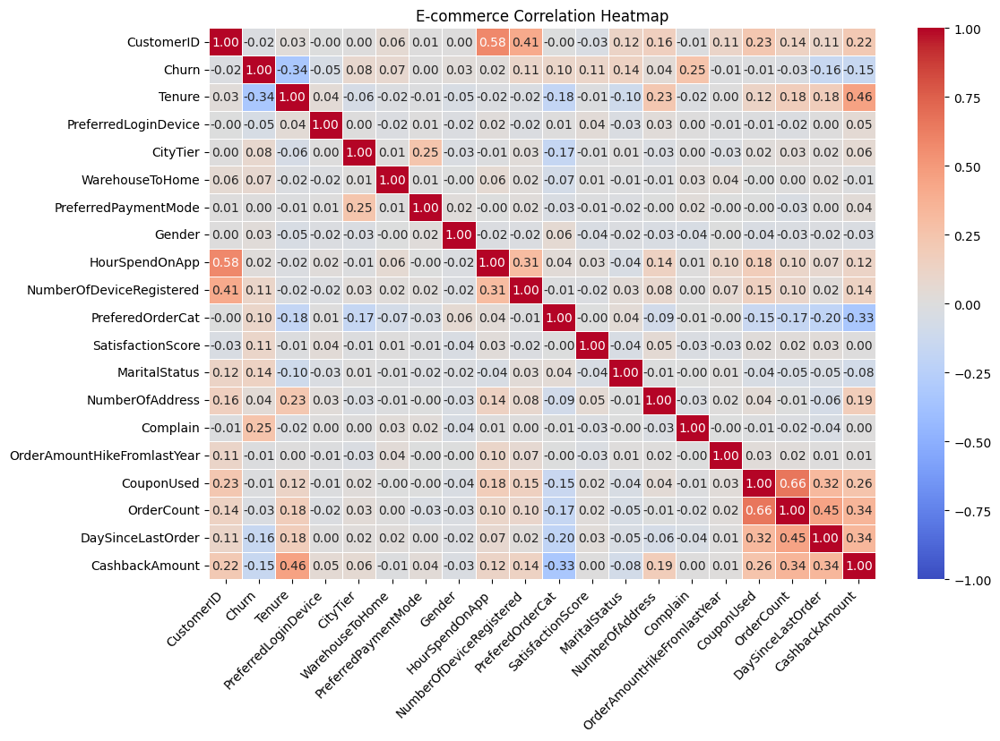

In [53]:
## Plot the correlation in the form of a heatmap using Matplotlib and Seaborn

plt.figure(figsize=(12, 8))
output = sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, vmin=-1, vmax=1)

# Rotate x-axis labels at a 45-degree angle for better visualization
output.set_xticklabels(output.get_xticklabels(), rotation=45, horizontalalignment='right')

plt.title("E-commerce Correlation Heatmap")
plt.show()

In [54]:
from pandas_profiling import ProfileReport
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Data Visualization and Exploration


<Figure size 600x600 with 0 Axes>

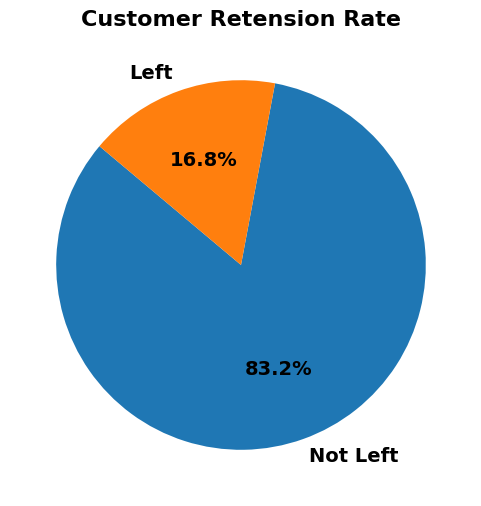

In [55]:
#How many customers churned?
# Count the number of churn (1) and not churn (0)
churn_counts = data['Churn'].value_counts()

# Create a pie chart
plt.figure(figsize=(6, 6))
# Create a pie chart with bold and larger labels
plt.figure(figsize=(6, 6))
plt.pie(churn_counts, labels=['Not Left', 'Left'], autopct='%1.1f%%', startangle=140,
        textprops={'fontweight': 'bold', 'fontsize': 14})  # Customize font properties
plt.title('Customer Retension Rate', fontsize=16, fontweight='bold')  # Customize title font properties
plt.savefig("churn_not_churn_percent.png")
# Show the pie chart
plt.show()

In [56]:
data.columns

Index(['CustomerID', 'Churn', 'Tenure', 'PreferredLoginDevice', 'CityTier',
       'WarehouseToHome', 'PreferredPaymentMode', 'Gender', 'HourSpendOnApp',
       'NumberOfDeviceRegistered', 'PreferedOrderCat', 'SatisfactionScore',
       'MaritalStatus', 'NumberOfAddress', 'Complain',
       'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount'],
      dtype='object')

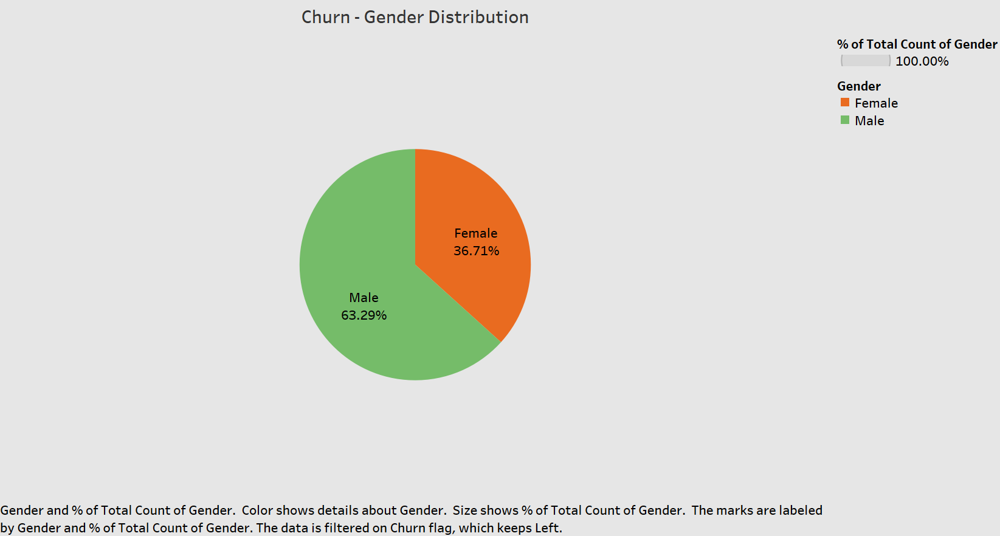

In [73]:
%matplotlib inline
from IPython.display import Image
Image(r"C:\Users\91966\Desktop\Sem 3\303 Marketing Analytics\Churn Analytics\New Churn Lab\Plot 2.png")

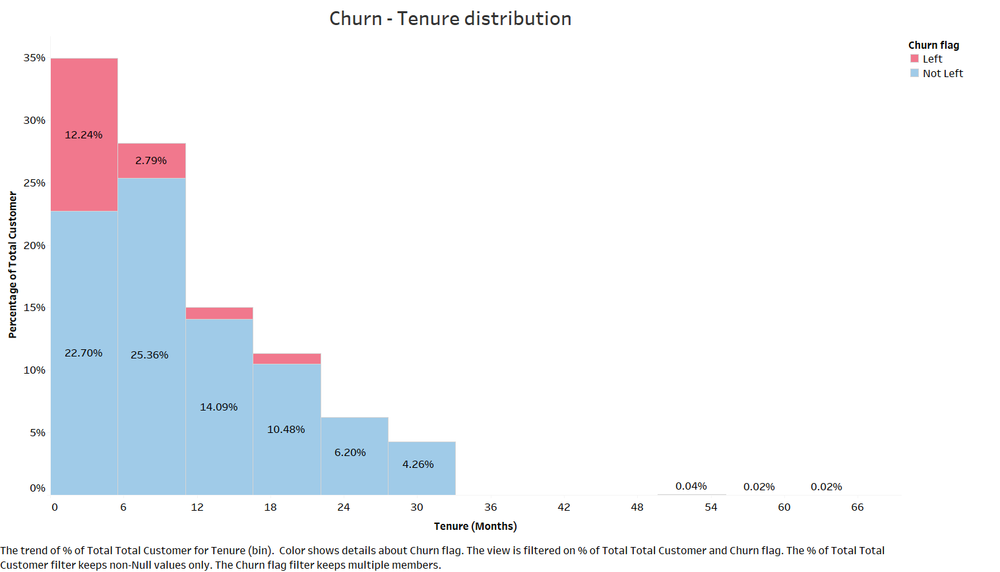

In [74]:
Image(r"C:\Users\91966\Desktop\Sem 3\303 Marketing Analytics\Churn Analytics\New Churn Lab\Plot 3.png")

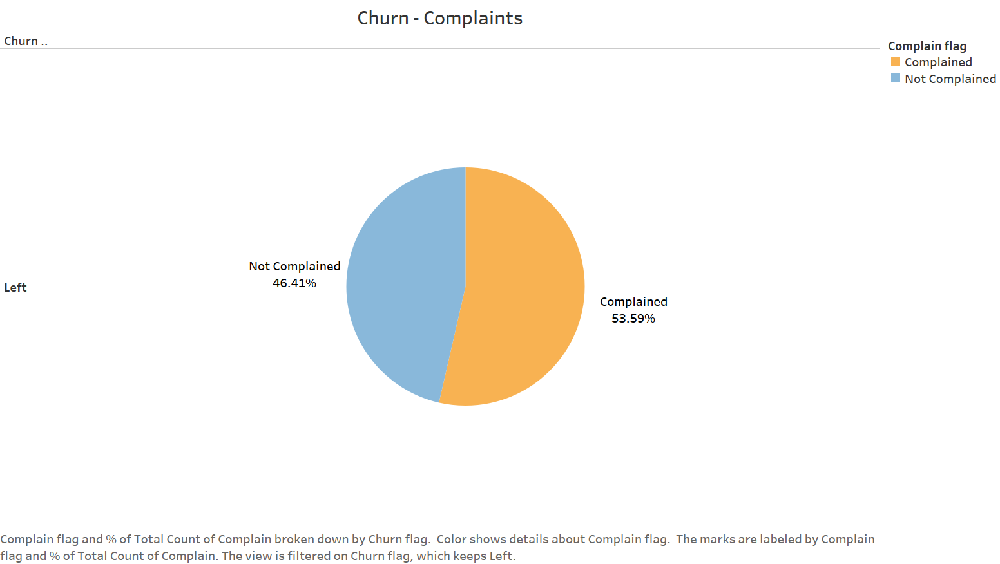

In [75]:
Image(r"C:\Users\91966\Desktop\Sem 3\303 Marketing Analytics\Churn Analytics\New Churn Lab\Plot 4.png")

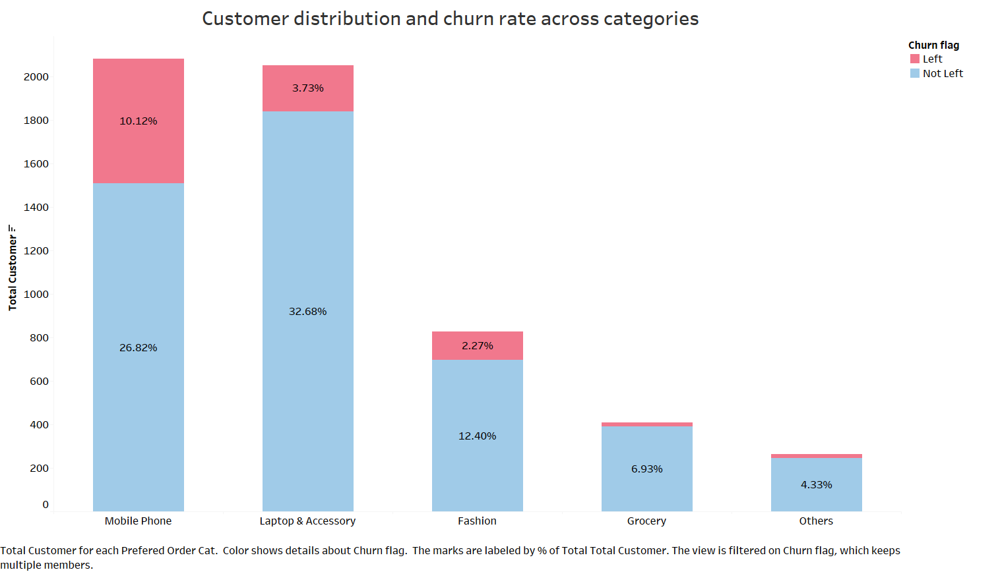

In [76]:
Image(r"C:\Users\91966\Desktop\Sem 3\303 Marketing Analytics\Churn Analytics\New Churn Lab\Plot 5.png")

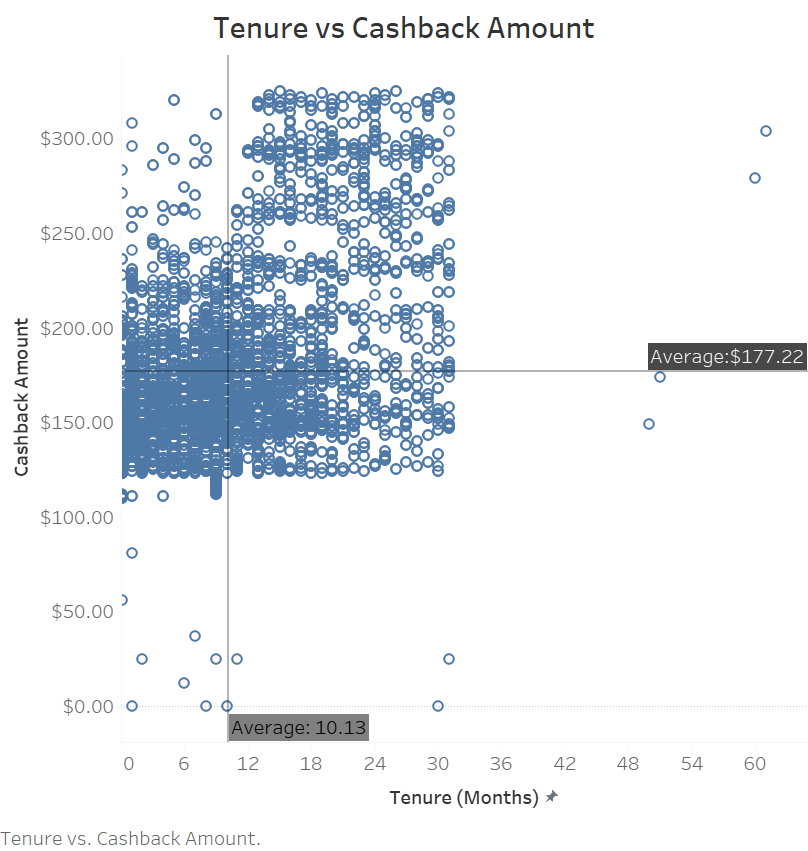

In [77]:
Image(r"C:\Users\91966\Desktop\Sem 3\303 Marketing Analytics\Churn Analytics\New Churn Lab\Plot 6.png")

## Model Building

In [57]:
#divide data as input nd output
X = data.drop(['CustomerID','Churn'], axis=1)
y = data['Churn']

In [58]:
#divide data into train and test
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.20, random_state=42)

In [59]:
# Use of Decision Tree Classifier model.

dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train,y_train)

DecisionTreeClassifier(random_state=42)

In [60]:
## Predicting the Churn using Decision Tree
y_pred_dt = dt_classifier.predict(X_test)

## Confusion Matrix

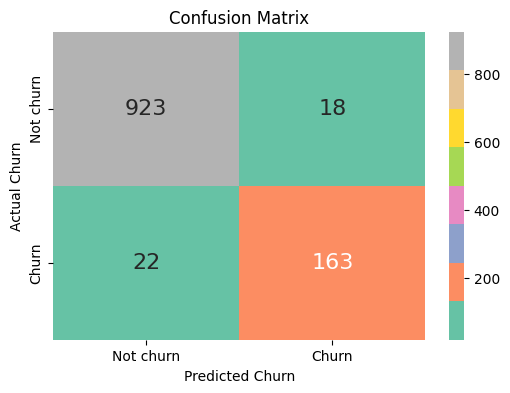

In [61]:
## Create a confusion matrix for churn and non-churn customers.

from sklearn.metrics import confusion_matrix

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred_dt)

# Create a heatmap of the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Set2", xticklabels=["Not churn", "Churn"],
                        yticklabels=["Not churn", "Churn"], annot_kws={"size": 16})
plt.xlabel("Predicted Churn")
plt.ylabel("Actual Churn")
plt.title("Confusion Matrix")
plt.show()

In [62]:
## Calculating the accuracy of the model.

accuracy_dt = accuracy_score(y_test,y_pred_dt)
print(f'The predicted value of accuracy using Decision Tree classifier model : {accuracy_dt:.4f}')

The predicted value of accuracy using Decision Tree classifier model : 0.9645


In [64]:
logistic_reg = LogisticRegression(random_state=42,max_iter=500)
logistic_reg.fit(X_train,y_train)

LogisticRegression(max_iter=500, random_state=42)

In [65]:
## Predicting the Churn using Logistic Regression

y_pred_lr = logistic_reg.predict(X_test)
accuracy_lr = accuracy_score(y_test,y_pred_lr)
print(f'The predicted value of accuracy using Logistic Regression model : {accuracy_lr:.4f}')

The predicted value of accuracy using Logistic Regression model : 0.8917


In [71]:
I =importances(dt_classifier,X_test,y_test, features=X.columns)
I

,Importance
Feature,
Tenure,0.134103
Complain,0.075488
NumberOfAddress,0.054174
DaySinceLastOrder,0.046181
SatisfactionScore,0.041741
WarehouseToHome,0.035524
PreferredPaymentMode,0.034636
OrderAmountHikeFromlastYear,0.033748
MaritalStatus,0.027531
